In [1]:
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


In [2]:
col_type = {'CODE': str}

patient = pd.read_csv("./test_data/data/dest/patients.csv.gz")
obs = pd.read_csv("./test_data/data/dest/observations.csv.gz")
encounters = pd.read_csv("./test_data/data/dest/encounters.csv.gz")
medications = pd.read_csv("./test_data/data/dest/medications.csv.gz")
cond = pd.read_csv("./test_data/data/dest/conditions.csv.gz", dtype=col_type)
dict_loinc = pd.read_csv("./test_data/data/dest/dictionary_loinc.csv")
dict_snomed = pd.read_csv("./test_data/data/dest/dictionary_snomed.csv")
dict_rxnorm = pd.read_csv("./test_data/data/dest/dictionary_rxnorm.csv")

# Clean the patient table

In [3]:
profile = ProfileReport(patient, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|████████████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.75it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
# Set gender values as 'NaN' if not M or F
patient['GENDER'] = patient['GENDER'].where(patient['GENDER'].isin(['M', 'F']), np.nan)

In [6]:
# Drop patients with missing data for gender or birth date
patient_clean = patient[(patient.GENDER.notnull()) & (patient.BIRTHDATE.notnull())]
patient_clean.Id.nunique()

1136

In [8]:
# Limit dataset to columns we are interested in right now
patient_clean = patient_clean[["Id", "BIRTHDATE", "GENDER"]]

# Merge and clean the observations table

In [9]:
# Rename columns
obs = obs.rename(columns={"CODE": "LOINC_CODE",
                          "PATIENT":"Id"})
obs["LOINC_CODE"].value_counts()

LOINC_CODE
-7           31732
72514-3      14514
8480-6       14444
8462-4       14444
29463-7      13252
             ...  
417181009        2
21924-6          2
85344-0          2
3024-7           1
3016-3           1
Name: count, Length: 233, dtype: int64

In [10]:
# Replace "-7" with "Nan" - this is not a valid code (need to look into what this represents but remove for now)
obs["LOINC_CODE"] = obs["LOINC_CODE"].replace(to_replace=r"-7$", value=np.nan, regex=True)
obs = obs[obs["LOINC_CODE"].notnull()]

In [11]:
# Check for missing values
obs["LOINC_CODE"].isnull().sum()

np.int64(0)

In [12]:
# Merge obs data with patient
obs_data = patient_clean.merge(obs, on='Id', how='left')

In [13]:
obs_data.head()

,Id,BIRTHDATE,GENDER,DATE,ENCOUNTER,CATEGORY,LOINC_CODE,VALUE,UNITS,TYPE
0,b9c610cd-28a6-4636-ccb6-c7a0d2a4cb85,2019-02-17,M,2019-02-17T05:07:38Z,748f8357-6cc7-551d-f31a-32fa2cf84126,vital-signs,8302-2,51.4,cm,numeric
1,b9c610cd-28a6-4636-ccb6-c7a0d2a4cb85,2019-02-17,M,2019-02-17T05:07:38Z,748f8357-6cc7-551d-f31a-32fa2cf84126,vital-signs,72514-3,1.0,{score},numeric
2,b9c610cd-28a6-4636-ccb6-c7a0d2a4cb85,2019-02-17,M,2019-02-17T05:07:38Z,748f8357-6cc7-551d-f31a-32fa2cf84126,vital-signs,77606-2,57.9,%,numeric
3,b9c610cd-28a6-4636-ccb6-c7a0d2a4cb85,2019-02-17,M,2019-02-17T05:07:38Z,748f8357-6cc7-551d-f31a-32fa2cf84126,vital-signs,9843-4,34.8,cm,numeric
4,b9c610cd-28a6-4636-ccb6-c7a0d2a4cb85,2019-02-17,M,2019-02-17T05:07:38Z,748f8357-6cc7-551d-f31a-32fa2cf84126,vital-signs,8462-4,89.0,mm[Hg],numeric


In [14]:
profile = ProfileReport(obs_data, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|████████████████████████████████████████████████████████████| 10/10 [00:07<00:00,  1.33it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [18]:
print("Observations shape:", obs_data.shape)
cond_data_clean = obs_data.drop_duplicates()
print("Observations clean shape:", obs_data_clean.shape)


Observations shape: (442515, 10)
Observations clean shape: (442515, 10)


# Merge and clean the conditions table

In [19]:
# Rename columns
cond = cond.rename(columns={"CODE": "SNOMED_CODE",
                           "PATIENT": "Id"})

In [20]:
cond.head()

,START,STOP,Id,ENCOUNTER,SNOMED_CODE
0,2013-06-24,2013-07-02,c1f1fcaa-82fd-d5b7-3544-c8f9708b06a8,0b2794bd-ec2b-d34f-0610-2523b3b7fcf0,10509002.0
1,2016-02-27,2016-03-14,c1f1fcaa-82fd-d5b7-3544-c8f9708b06a8,a6d818dd-0983-fd1c-eefa-3d2295532c45,283371005.0
2,2016-08-11,2016-08-22,c1f1fcaa-82fd-d5b7-3544-c8f9708b06a8,36d2e781-4655-0a11-1f70-c69856e02019,444814009.0
3,2016-11-27,2016-12-17,c1f1fcaa-82fd-d5b7-3544-c8f9708b06a8,c8eaaf41-958b-31ab-7de5-568cee8751f3,444814009.0
4,2017-02-22,2017-06-02,c1f1fcaa-82fd-d5b7-3544-c8f9708b06a8,6474f606-5a1b-48c0-bbbf-ad6dcbc24d4e,16114001.0


In [21]:
# SNOMED codes appear to have been corrupted with ".0" on the end 
# (usually happens if the file has been opened/saved with excel or google sheets)
# For now I am using regex to remove ".0" from the end of all SNOMED codes
cond['SNOMED_CODE'] = cond['SNOMED_CODE'].str.replace(r'\.0$', '', regex=True)
cond['SNOMED_CODE']

0         10509002
1        283371005
2        444814009
3        444814009
4         16114001
           ...    
38095    160903007
38096     38822007
38097    160904001
38098     73595000
38099    706893006
Name: SNOMED_CODE, Length: 38100, dtype: object

In [22]:
# Merge with patient file
cond_data = patient_clean[["Id", "BIRTHDATE", "GENDER"]].merge(cond, on='Id', how='left')
cond_data.head()

,Id,BIRTHDATE,GENDER,START,STOP,ENCOUNTER,SNOMED_CODE
0,b9c610cd-28a6-4636-ccb6-c7a0d2a4cb85,2019-02-17,M,NaN,NaN,NaN,NaN
1,339144f8-50e1-633e-a013-f361391c4cff,1998-05-11,M,2012-06-11,2013-06-17,33782d5d-ba30-c2e5-c432-e36a8f6c1cc8,160968000
2,339144f8-50e1-633e-a013-f361391c4cff,1998-05-11,M,2012-08-07,2012-09-02,4224e87e-d63e-4b30-a01b-03daffac9d26,44465007
3,339144f8-50e1-633e-a013-f361391c4cff,1998-05-11,M,2015-06-29,NaN,28f73bd9-73d3-de33-35a6-cabeb9a5795c,162864005
4,339144f8-50e1-633e-a013-f361391c4cff,1998-05-11,M,2016-07-04,NaN,8195411f-4a65-9245-07d3-1999e1c223df,59621000


In [23]:
profile = ProfileReport(cond_data, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████| 7/7 [05:13<00:00, 44.74s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
print("Conditions shape:", cond_data.shape)
cond_data_clean = cond_data.drop_duplicates()
print("Conditions clean shape:", cond_data_clean.shape)


Conditions shape: (37445, 7)
Conditions clean shape: (37421, 7)


# Merge and clean the medications table

In [25]:
medications.head()

,START,STOP,PATIENT,PAYER,ENCOUNTER,CODE,BASE_COST,PAYER_COVERAGE,DISPENSES,TOTALCOST,REASONCODE
0,2020-02-17T10:40:32Z,NaN,b9c610cd-28a6-4636-ccb6-c7a0d2a4cb85,7c4411ce-02f1-39b5-b9ec-dfbea9ad3c1a,01efcc52-15d6-51e9-faa2-bee069fcbe44,1014676.0,21.45,0.0,21,450.45,NaN
1,2020-02-17T10:40:32Z,NaN,b9c610cd-28a6-4636-ccb6-c7a0d2a4cb85,7c4411ce-02f1-39b5-b9ec-dfbea9ad3c1a,01efcc52-15d6-51e9-faa2-bee069fcbe44,1870230.0,231.58,0.0,21,4863.18,NaN
2,2013-06-24T06:39:19Z,2013-07-02T06:39:19Z,c1f1fcaa-82fd-d5b7-3544-c8f9708b06a8,42c4fca7-f8a9-3cd1-982a-dd9751bf3e2a,0b2794bd-ec2b-d34f-0610-2523b3b7fcf0,1043400.0,7.59,0.0,1,7.59,10509002.0
3,2016-02-27T08:52:29Z,2016-03-14T08:52:29Z,c1f1fcaa-82fd-d5b7-3544-c8f9708b06a8,6e2f1a2d-27bd-3701-8d08-dae202c58632,a6d818dd-0983-fd1c-eefa-3d2295532c45,198405.0,12.48,0.0,1,12.48,NaN
4,2017-02-22T09:25:31Z,2017-06-02T09:25:31Z,c1f1fcaa-82fd-d5b7-3544-c8f9708b06a8,047f6ec3-6215-35eb-9608-f9dda363a44c,6474f606-5a1b-48c0-bbbf-ad6dcbc24d4e,313820.0,4.77,0.0,3,14.31,NaN


In [28]:
# codes appear to have been corrupted with ".0" on the end 
# (usually happens if the file has been opened/saved with excel or google sheets)
# For now I am using regex to remove ".0" from the end of all codes
medications['CODE'] = medications['CODE'].str.replace(r'\.0$', '', regex=True)

In [29]:
medications['CODE'].value_counts()

CODE
314076     8153
310798     7498
308136     5931
106892     4060
860975     2991
           ... 
245314        1
2103182       1
1049635       1
1735006       1
2047241       1
Name: count, Length: 172, dtype: int64

In [30]:
medications = medications.rename(columns={"PATIENT": "Id"})

# Merge with patient file
med_data = patient_clean[["Id", "BIRTHDATE", "GENDER"]].merge(medications, on='Id', how='left')
med_data.head()

,Id,BIRTHDATE,GENDER,START,STOP,PAYER,ENCOUNTER,CODE,BASE_COST,PAYER_COVERAGE,DISPENSES,TOTALCOST,REASONCODE
0,b9c610cd-28a6-4636-ccb6-c7a0d2a4cb85,2019-02-17,M,2020-02-17T10:40:32Z,NaN,7c4411ce-02f1-39b5-b9ec-dfbea9ad3c1a,01efcc52-15d6-51e9-faa2-bee069fcbe44,1014676,21.45,0.0,21.0,450.45,NaN
1,b9c610cd-28a6-4636-ccb6-c7a0d2a4cb85,2019-02-17,M,2020-02-17T10:40:32Z,NaN,7c4411ce-02f1-39b5-b9ec-dfbea9ad3c1a,01efcc52-15d6-51e9-faa2-bee069fcbe44,1870230,231.58,0.0,21.0,4863.18,NaN
2,339144f8-50e1-633e-a013-f361391c4cff,1998-05-11,M,2012-08-07T05:03:31Z,2012-09-02T05:03:31Z,047f6ec3-6215-35eb-9608-f9dda363a44c,4224e87e-d63e-4b30-a01b-03daffac9d26,313782,4.81,0.0,1.0,4.81,NaN
3,339144f8-50e1-633e-a013-f361391c4cff,1998-05-11,M,2016-07-04T05:03:31Z,2017-07-10T05:03:31Z,6e2f1a2d-27bd-3701-8d08-dae202c58632,8195411f-4a65-9245-07d3-1999e1c223df,310798,0.01,0.0,12.0,0.12,59621000.0
4,339144f8-50e1-633e-a013-f361391c4cff,1998-05-11,M,2016-08-03T05:03:31Z,2017-07-10T05:03:31Z,6e2f1a2d-27bd-3701-8d08-dae202c58632,67a2eb36-b9c2-5964-0dec-81369673e184,308136,0.02,0.0,341.0,6.82,59621000.0


In [31]:
profile = ProfileReport(med_data, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|████████████████████████████████████████████████████████████| 13/13 [01:19<00:00,  6.15s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [33]:
print("Medications shape:", med_data.shape)
med_data_clean = med_data.drop_duplicates()
print("Medications clean shape:", med_data_clean.shape)


Medications shape: (55873, 13)
Medications clean shape: (55865, 13)


# Descriptive analysis

In [34]:
# Number of unique patients
patient_clean['Id'].nunique()

1136

In [35]:
# Gender distribution
patient_clean.GENDER.value_counts()

GENDER
F    599
M    537
Name: count, dtype: int64

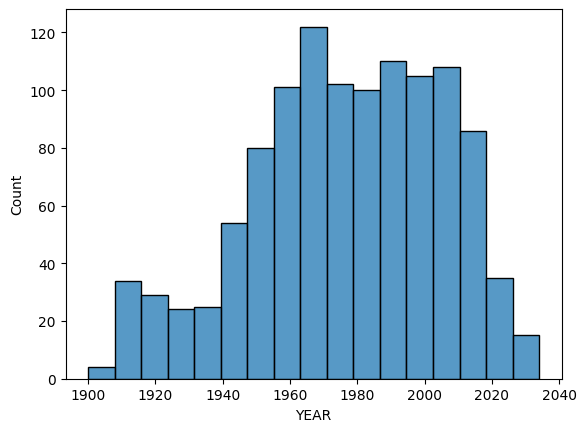

In [36]:
# Birth year
patient_clean['BIRTHDATE'] = pd.to_datetime(patient_clean['BIRTHDATE'], errors='coerce')
patient_clean['YEAR'] = patient_clean['BIRTHDATE'].dt.year
sns.histplot(data=patient_clean, x='YEAR')
plt.show()

In [41]:
obs_data["LOINC_CODE"].value_counts()


LOINC_CODE
72514-3      14245
8462-4       14175
8480-6       14175
8867-4       12731
9279-1       12731
             ...  
85343-2          2
417181009        2
21924-6          2
85344-0          2
3016-3           1
Name: count, Length: 204, dtype: int64

In [53]:
# The most common loinc code
dict_loinc[dict_loinc['CODE'] == '72514-3']

,CODE,DESCRIPTION
1,72514-3,Pain severity - 0-10 verbal numeric rating [Sc...


In [46]:
cond_data["SNOMED_CODE"].value_counts()


SNOMED_CODE
160903007    13563
73595000      5045
160904001     2400
422650009     1216
444814009     1203
             ...  
161622006        1
234466008        1
86175003         1
370143000        1
1734006          1
Name: count, Length: 204, dtype: int64

In [50]:
# The most common SNOMED code
dict_snomed[dict_snomed["CODE"] == 160903007]

,CODE,DESCRIPTION
10,160903007,Full-time employment (finding)


In [39]:
med_data["CODE"].value_counts()

CODE
314076     8095
310798     7397
308136     5875
106892     4060
860975     2991
           ... 
245314        1
2103182       1
1049635       1
1735006       1
2047241       1
Name: count, Length: 172, dtype: int64

In [55]:
# The most common rxNorm code
dict_rxnorm[dict_rxnorm["CODE"] == 314076]

,CODE,DESCRIPTION
10,314076,lisinopril 10 MG Oral Tablet


# Explore systolic and diastolic BP

#### Note: these blood pressure readings are from the observations data, there may be other readings stored as SNOMED codes in the conditions or other tables

In [56]:
dict_loinc[dict_loinc["DESCRIPTION"].str.contains("stolic")]

,CODE,DESCRIPTION
5,8462-4,Diastolic Blood Pressure
6,8480-6,Systolic Blood Pressure


In [57]:
# Set value column to a numeric dtype
obs_data["VALUE"] = pd.to_numeric(obs_data['VALUE'], errors='coerce')

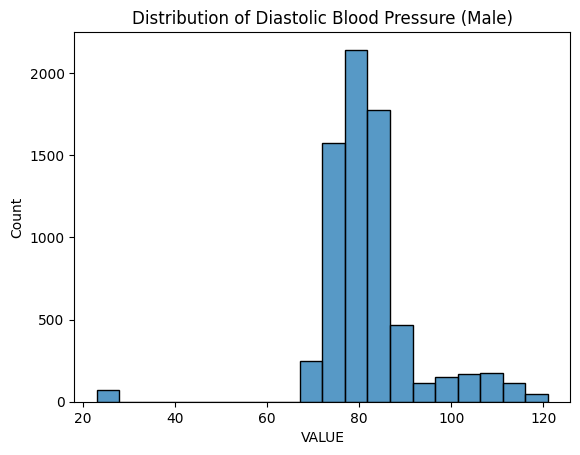

In [59]:
# Plot dBP in Males
sns.histplot(data=obs_data[(obs_data["LOINC_CODE"] == "8462-4") & (obs_data["GENDER"] == "M")], 
             x="VALUE",
             bins=20)

plt.title("Distribution of Diastolic Blood Pressure (Male)")
plt.xlabel("VALUE")
plt.ylabel("Count")
plt.show()

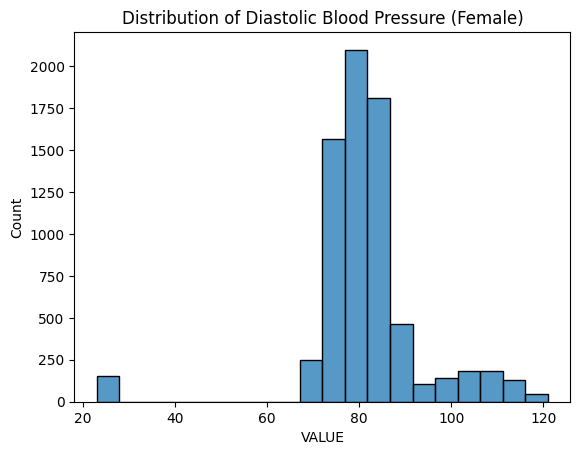

In [61]:
# Plot dBP in females
sns.histplot(data=obs_data[(obs_data["LOINC_CODE"] == "8462-4") & (obs_data["GENDER"] == "F")], 
             x="VALUE", 
             bins=20)

plt.title("Distribution of Diastolic Blood Pressure (Female)")
plt.xlabel("VALUE")
plt.ylabel("Count")
plt.show()

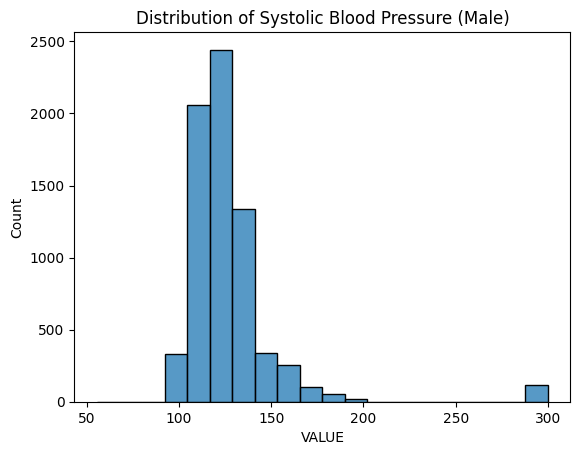

In [62]:
# Plot sBP in Males
sns.histplot(data=obs_data[(obs_data["LOINC_CODE"] == "8480-6") & (obs_data["GENDER"] == "M")], 
             x="VALUE",
             bins=20)

plt.title("Distribution of Systolic Blood Pressure (Male)")
plt.xlabel("VALUE")
plt.ylabel("Count")
plt.show()

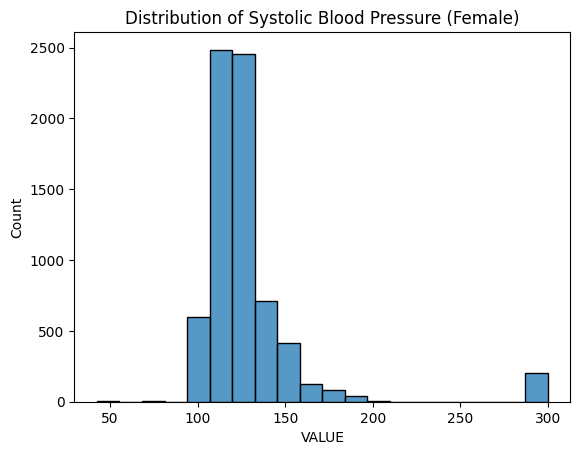

In [63]:
# Plot sBP in Females
sns.histplot(data=obs_data[(obs_data["LOINC_CODE"] == "8480-6") & (obs_data["GENDER"] == "F")], 
             x="VALUE",
             bins=20)

plt.title("Distribution of Systolic Blood Pressure (Female)")
plt.xlabel("VALUE")
plt.ylabel("Count")
plt.show()

### NOTE
These plots contains ALL readings. In further analyses one might focus on the mean or max reading for each patient <br> 
For more in-depth analysis it might be interesting to see changes over time in readings or response to medication

# Explore BMI in diagnosed hypertension

In [65]:
# Find code for BMI
dict_loinc[dict_loinc["DESCRIPTION"].str.contains("BMI")]

,CODE,DESCRIPTION
37,59576-9,Body mass index (BMI) [Percentile] Per age and...


In [66]:
# Find code for hypertension
dict_snomed[dict_snomed["DESCRIPTION"].str.contains("Hyper")]

,CODE,DESCRIPTION
7,59621000,Hypertension
35,302870006,Hypertriglyceridemia (disorder)
60,55822004,Hyperlipidemia
85,80394007,Hyperglycemia (disorder)


### NOTE
there are many SNOMED codes to indicate hypertension, this focuses on one code


In [68]:
# Identify patient ID's of those with a dx of hypertension 
hypertension_pat = list(cond_data[cond_data["SNOMED_CODE"] == "59621000"]["Id"])
len(hypertension_pat)

286

In [70]:
# Create subset df of those with Hypertension
obs_data_htn = obs_data[obs_data["Id"].isin(hypertension_pat)]

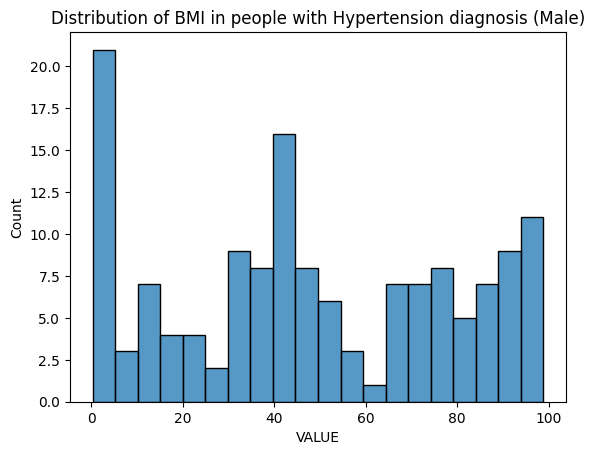

In [72]:
# Plot distribution of BMI - again this contains ALL BMI readings (may be multiple per patient)
sns.histplot(data=obs_data_htn[(obs_data_htn["LOINC_CODE"] == "59576-9") & (obs_data_htn["GENDER"] == "M")], 
             x="VALUE",
             bins=20)

plt.title("Distribution of BMI in people with Hypertension diagnosis (Male)")
plt.xlabel("VALUE")
plt.ylabel("Count")
plt.show()

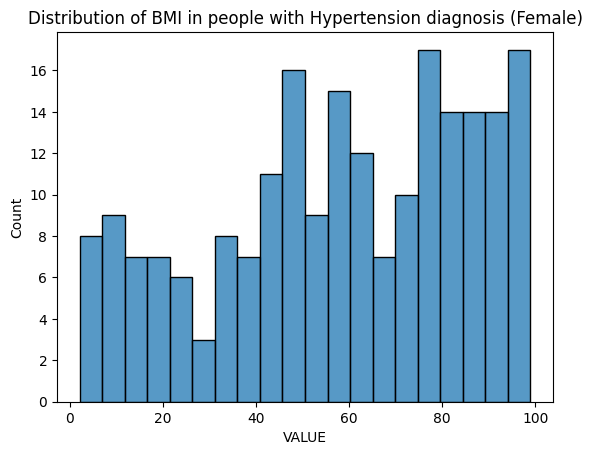

In [73]:
sns.histplot(data=obs_data_htn[(obs_data_htn["LOINC_CODE"] == "59576-9") & (obs_data_htn["GENDER"] == "F")], 
             x="VALUE",
             bins=20)

plt.title("Distribution of BMI in people with Hypertension diagnosis (Female)")
plt.xlabel("VALUE")
plt.ylabel("Count")
plt.show()

# Prevalence of Hypertension

In [74]:
print("The prevalence of hypertension in this dataset is: ", (len(hypertension_pat) / patient_clean.Id.nunique()) * 100)

The prevalence of hypertension in this dataset is:  25.176056338028168


In [75]:
patient_clean.loc[patient_clean['Id'].isin(hypertension_pat), 'HYPERTENSION'] = 1
patient_clean['HYPERTENSION'] = patient_clean['Id'].isin(hypertension_pat).astype(int)
patient_clean['HYPERTENSION'].value_counts()

HYPERTENSION
0    850
1    286
Name: count, dtype: int64

In [76]:
gender_specific_prev = patient_clean.groupby('GENDER')['HYPERTENSION'].mean()
print(gender_specific_prev)

GENDER
F    0.238731
M    0.266294
Name: HYPERTENSION, dtype: float64


In [77]:
uk_gender_weights = {
    'F': 0.51,
    'M': 0.49
}
adjusted_prev = sum(
    gender_specific_prev[gender] * uk_gender_weights.get(gender, 0)
    for gender in gender_specific_prev.index
)

print(f"Gender-adjusted prevalence of hypertension (UK population): {adjusted_prev * 100:.2f}%")

Gender-adjusted prevalence of hypertension (UK population): 25.22%


### Note
Prevalence of hypertension varies by age, gender, ethnicity, geographical location, socio-economic status <br>
These are factors that one might consider adjusting for with more time and scope - this would depend on the project
